# Imports

In [ ]:
import os
import logging
import cv2
import glob
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from matplotlib import pyplot as plt
from timeit import default_timer as timer
from PIL import Image
from numpy import ones
from numpy import zeros
from numpy.random import randint
from keras.utils.vis_utils import plot_model
from keras.initializers import RandomNormal
from keras.models import Model,Input
from keras.layers import Conv2D,MaxPool2D,Convolution2DTranspose,LeakyReLU,Dropout,BatchNormalization,Flatten,Dense,Reshape
from keras import backend as K
from keras.losses import BinaryCrossentropy
from keras.metrics import BinaryAccuracy
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers


%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
os.chdir("/content/drive/MyDrive/Colab Notebooks/Computer Vision Course/Final Project")

Mounted at /content/drive


In [ ]:
!nvidia-smi

Sun Mar 20 05:04:30 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
print("Num GPUs Available ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available  1


# Experiment 2

## Hyper-Parameters

For the second experiment we choose the following hyper-parameters:</br>
We choose 15 Epochs for a few resons. First, a higher epoch number would occasionally crash our colab session when reaching the higher epochs. Second, we did not see a noticable impovement in the GAN loss after around the 15'th epoch.</br>
We choose batch size of 1 as it was recomended for Pix2Pix GAN.</br>
We imported the data as 128x128x3 images as done in the "Context Encoders: Feature Learning by Inpainting" artical, another reason is that higher image dimentions would crash our colab RAM.</br>
We split 10% of the data into test and validation sets so we could evaluate our models preformence.</br>
We used learning rate of 0.0001 for the generator model and 0.0002 for the discriminator, we choose diffrent learning rates for both models as it was recomended to help our model train.</br>
The only difference between the first and second experiment here is the increase of learning rate. The main reason for this adjustment is that we wanted to see if we can increase the efficiency of training without compromising the models ability to learn.

In [ ]:
X_path = "Data/cat_missing"
Y_path = "Data/cats"
models_path = "Models"
experiance_name = "experiment_2"

EPOCHS = 15
BATCH_SIZE = 1
IMG_DIM = 128
DATA_SPLIT = 0.1
G_LR = 0.0001 
D_LR = 0.0002


target_size = (IMG_DIM,IMG_DIM)
input_shape = (IMG_DIM,IMG_DIM,3)

## Loading Data

For data preprocessing we normlized the pixels of the target image to a [-1,1] floats but did not normlize the input image, This is because we intend to use the transfer learning method with the VGG16 net therefore we will use the VGG16 model's preprocessing function later. Then we extracted the missing and target images, and saved the dataset as a numpy array for future use. We then converted it into a TensorFlow Dataset class and split it to train test and validation sets.

In [ ]:
def normlize(img):
  return (img / 127.5) - 1

def unnormlize(img):
  return ((img + 1) * 127.5).astype("int16")

def load_image(img_name,folder_path,img_dim = None,normlize = True):
    img_path = folder_path + "/" + img_name
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if img_dim:
      img = cv2.resize(img, dsize=(img_dim, img_dim), interpolation=cv2.INTER_CUBIC)
    img = np.array(img)
    if normlize:
      img = (img / 127.5) - 1
    return img.astype("float32")

In [ ]:
def load_data_as_np(X_path,Y_path,img_dim=None):
  training_binary_path = f"Data/dataset_{img_dim}_VGG16.npy"

  if not os.path.isfile(training_binary_path):
    dataset = []
    for count, image in enumerate(glob.glob(f'{X_path}/*')):
      x_img = load_image(image.split(os.path.sep)[-1],X_path,img_dim,normlize = False)
      y_img = load_image(image.split(os.path.sep)[-1],Y_path,img_dim,normlize = True)
      dataset.append(np.array([x_img,y_img]))

      if count != 0 and count % 100 == 0:
        print("Loaded "+str(count)+" Images...")

    dataset = np.array(dataset)
    print(f"Saving dataset as {training_binary_path}")
    np.save(training_binary_path,dataset)

  else:
    print(f"Loading existing dataset from '{training_binary_path}'...")
    dataset = np.load(training_binary_path)
    print(f"Finished loading dataset shaped {dataset.shape}.")
  
  return dataset.astype("float32")

def np2tf_data(dataset,shuffle = False, batch_size = 1, split = 0):
  dataset = tf.data.Dataset.from_tensor_slices(dataset)
  # create train test val split
  if split != 0:
    data_size = len(dataset)
    split_size = int(data_size * split)
    test_data = dataset.take(split_size).batch(1)
    train_data = dataset.skip(split_size)
    val_data = dataset.take(split_size).batch(1)
    train_data = dataset.skip(split_size*2).batch(batch_size)
    if shuffle:
      data_size = len(train_data)
      train_data = train_data.shuffle(data_size,reshuffle_each_iteration = True)

    print(f"Data Created and split into {len(train_data)} Training images, {len(test_data)} test images, {len(val_data)} validation images")
    return train_data, test_data, val_data

  # dont create train test val split
  else:
    if shuffle:
      data_size = len(dataset) # 5652
      dataset = dataset.shuffle(data_size,reshuffle_each_iteration = True)

    dataset = dataset.batch(batch_size)
    return dataset

In [ ]:
def fill_image(missing_img, new_img):
  # assume is unnormlized
  missing_img = missing_img.copy()
  missing_block = np.array([256,256,256])
  missing_block2 = np.array([253,253,253])
  for i in range(IMG_DIM):
    for j in range(IMG_DIM):
      p1 = missing_block2 <= missing_img[i][j]
      p2 = missing_img[i][j] <= missing_block
      p = np.logical_and(p1, p2)
      if p.all():
        missing_img[i][j] = new_img[i][j]
  return missing_img

In [ ]:
def plot_image(img,unnormlize = False):
  if unnormlize:
    img = img.copy()
    img = np.array(img)
    img = (img + 1)*127.5
    img = img.astype("int32")
  plt.figure()
  plt.imshow(img)
  plt.axis('off')
  plt.show()

def plotXY(x,y,titels = ['Missing Image','Real Image']):
  # assume is normlized
  plt.figure(figsize=(10, 10))
  plt.subplot(1, 2, 1)
  plt.title(titels[0])
  x = x.numpy()
  x = x.astype("int32")
  plt.axis('off')
  plt.imshow(x)
  plt.subplot(1, 2, 2)
  plt.title(titels[1])
  y = y.numpy()
  y = (y + 1)*127.5
  y = y.astype("int32")
  plt.imshow(y)
  plt.axis('off')

  plt.show()

In [ ]:
train_dataset = load_data_as_np(X_path,Y_path,IMG_DIM)

Loading existing dataset from 'Data/dataset_128_VGG16.npy'...
Finished loading dataset shaped (5652, 2, 128, 128, 3).


In [ ]:
train_dataset,test_dataset,val_dataset =  np2tf_data(train_dataset,shuffle = True, batch_size = BATCH_SIZE, split = DATA_SPLIT)

Data Created and split into 4522 Training images, 565 test images, 565 validation images


Plotting a few images from our dataset for illustration.

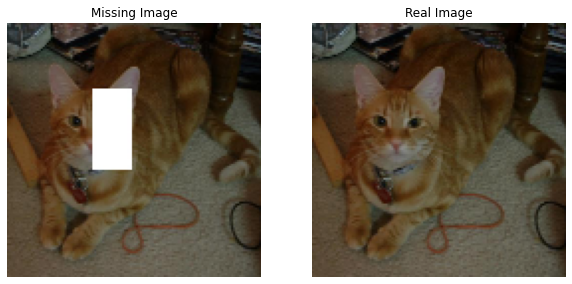

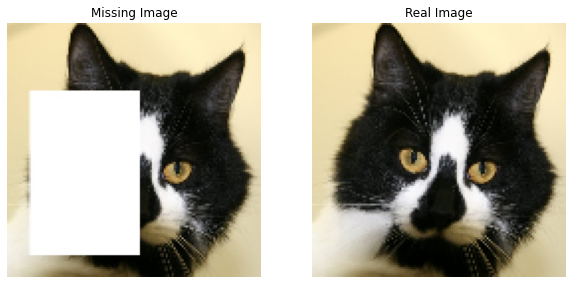

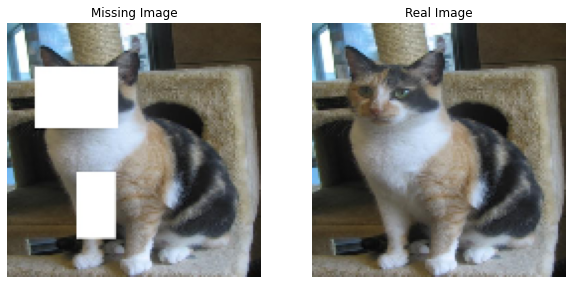

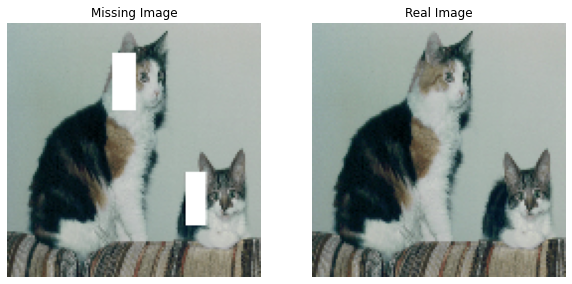

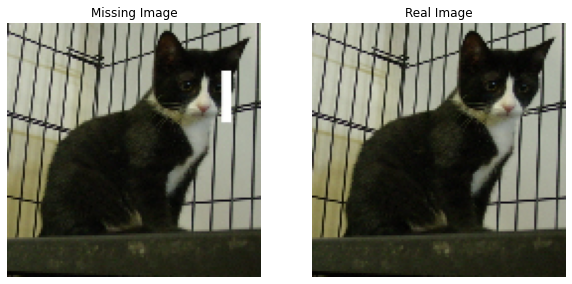

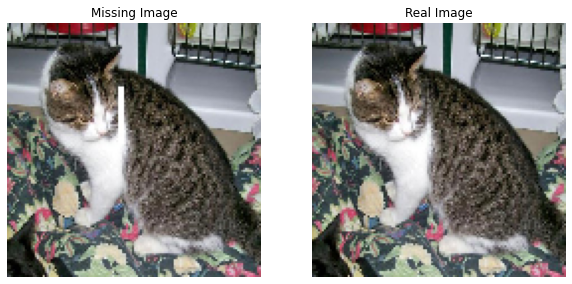

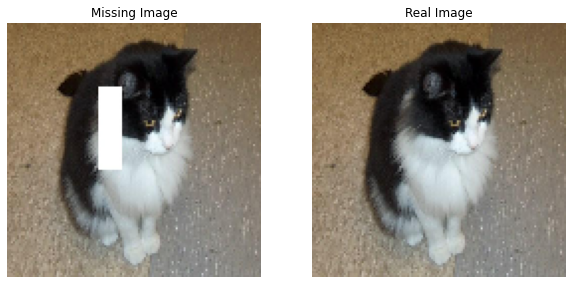

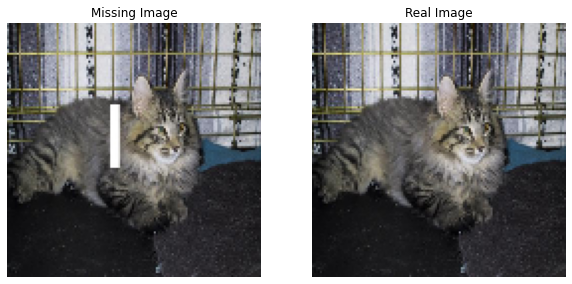

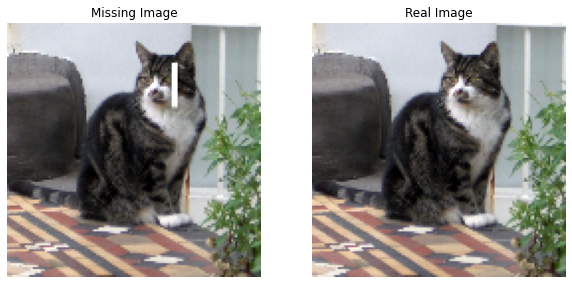

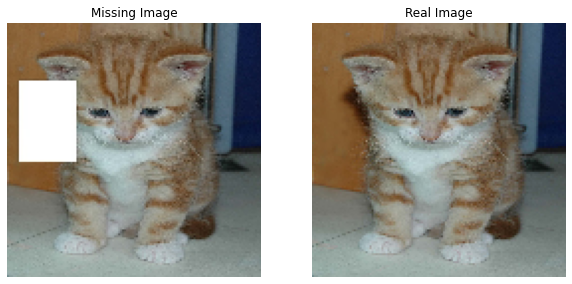

In [ ]:
for batch in train_dataset.take(10): 
  x,y = batch[0]
  plotXY(x,y)


## Generator

The generator model's responsibility is to get a input image with a missing section and generate a real looking image of the missing section.</br>
For the generator we use a encoder decoder architecture. We took inspration from the "Context Encoders: Feature Learning by Inpainting" artical and implemented a generator similar to a transfer learning architecture suggested in the artical. We also tried to implement a few tips from a <a href = "https://www.youtube.com/watch?v=X1mUN6dD8uE&ab_channel=DavidLopez-Paz">NIPS 2016 Workshop on Adversarial Training - Soumith Chintala - How to train a GAN</a> lecture by Soumith Chintala from the Facebook Ai Research team.
<h4>Architecture</h4>
<h4>Encoder</h4>
As inspired by the artical. Where in the artical, their encoder is derived from the AlexNet architecture, we have decided to use a more modern and efficient network as the encoder.</br>
Therefore we loaded the VGG16 model with a input shape of 128x128x3 (matching our data) and the pretrained "imagenet" based weights. eventually we flattened the embeding vector resulting in 8192 neurons, and disabled learning on these layers.</br>
<h4>Fully Connected Layer</h4>
To connect the encoder to the decoder we used a fully connected layer consisting 8192 nurons aswell.
<h4>Decoder</h4>
The decoder's architecture is the inverted encoder architecture consisting of 5 Conv2D layers with filter size of 512->512->256->128->64->3, strides of 2, LeakyReLU as activation function except for the last layer where we used the tanh activation funcyion to output a image with pixles in range [-1,1] to match the input and padding as same. We used Batch normalization after each layer except the last.
<h5>Few of the tips impemented are:</h5>
Batch normalization after each layer except the last.</br>
The use of "LeakuReLU" as a activation function insted of "relu".</br>
Using strided convolution layers instead of MaxPooling layers.</br>
Normlizing the images between -1 and 1.

In [ ]:
def decoder_block(layer_in, n_filters, filter_size=(3,3), stride=(2,2),activation = LeakyReLU(alpha=0.2), padding='same', dropout=False, batchnorm=True):
  g = Convolution2DTranspose(n_filters, filter_size, strides=stride,activation = activation, padding=padding)(layer_in)
  if batchnorm:
    g = BatchNormalization()(g, training=True)
  if dropout:
    g = Dropout(0.5)(g, training=True)

  return g

def define_generator(image_shape=(128, 128, 3), print = False):
  encoder = tf.keras.applications.vgg16.VGG16(
      weights="imagenet",
      include_top=False,
      input_shape=image_shape
  )
  embeded = Flatten()(encoder.output)
  fc1 = Dense(8192, activation=LeakyReLU(alpha=0.2))(embeded)
  if print:
    print(fc1.shape) #8192

  d0 = Reshape(target_shape=(4, 4, 512))(fc1)#4x4x512
  if print:
    print(d0.shape) #4x4x512
  d1 = decoder_block(d0 ,512)
  if print:
    print(d1.shape) #8x8x512
  d2 = decoder_block(d1, 256)
  if print:
    print(d2.shape) #16x16x256
  d3 = decoder_block(d2, 128)
  if print:
    print(d3.shape) #32x32x128
  d4 = decoder_block(d3, 64)
  if print:
    print(d4.shape) #64x64x64
  out_image = decoder_block(d4, 3,activation = "tanh", batchnorm=False)
  if print:
    print(out_image.shape) #128x128x3

  model = Model(encoder.input, out_image)

  for layer in encoder.layers:
	  layer.trainable = False
    
  return model

In [ ]:
generator = define_generator(input_shape)
generator.summary()

58900480/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                              

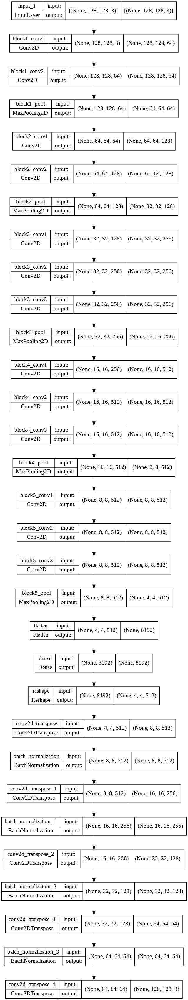

In [ ]:
plot_model(generator, show_shapes=True, show_layer_names=True)

## Discriminator

The discriminator model's responsibility is to get a input image and determine of the image is real or fake. This model is the generator's adversary and will be used to update the generators weights and help it generate more real looking images.<br>
<h4>Architecture</h4>
For the decoder we used a simple CNN architecture with 4 Conv2D layers with filter size of 64->128->256->512, strides of 2, LeakyReLU as activation function and padding as same. We used 2 Batch normalization layers. Eventualy we flattened the embedded vector  and added 3 fully connected layers with 512->256->1 nurons with the same LeakyReLU activation function and sigmoid for the output layer so we get a probbility value as if the inputed image is real or fake.

In [ ]:
def define_discriminator(input_shape=(128, 128, 3)):

  activation = LeakyReLU(alpha=0.2)
  filter_size=(3,3)
  stride=(2,2)
  l0 = Input(shape=input_shape)
  d = Conv2D(64, filter_size, strides=stride,activation = activation, padding='same')(l0)
  d = Conv2D(128, filter_size, strides=stride,activation = activation, padding='same')(d)
  d = BatchNormalization()(d, training=True)
  d = Conv2D(256, filter_size, strides=stride,activation = activation, padding='same')(d)
  d = Conv2D(512, filter_size, strides=stride,activation = activation, padding='same')(d)
  d = BatchNormalization()(d, training=True)
  d = Flatten()(d)
  d = Dense(512, activation=activation)(d)
  d = BatchNormalization()(d, training=True)
  d = Dense(256, activation=activation)(d)
  output = Dense(1, activation="sigmoid")(d)

  model = Model(l0, output)
  return model

In [ ]:
discriminator = define_discriminator()
discriminator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 64)        1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 batch_normalization_4 (Batc  (None, 32, 32, 128)      512       
 hNormalization)                                                 
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 256)       295168    
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 512)         1180160   
                                                           

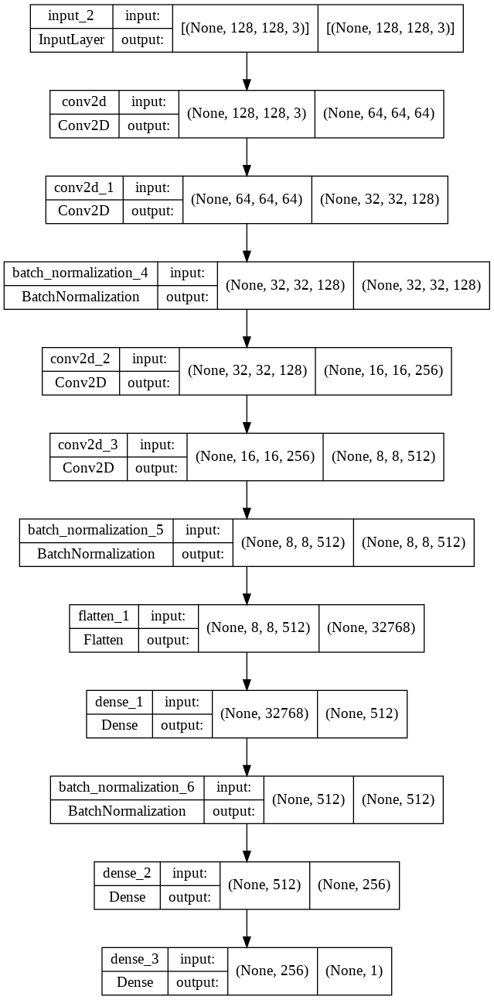

In [ ]:
plot_model(discriminator, show_shapes=True, show_layer_names=True)

## Training

We have implemented out own training loop and training on batch functions with the goal of having full controll over the training process, loss function and how the weights are updated.

In [ ]:
def plot_prediction(missing_img, real_img, generated_img):
  plt.figure(figsize=(10, 10))

  plt.subplot(1, 4, 1)
  plt.title('Missing Image')
  missing_img = missing_img.copy()
  missing_img = missing_img.astype("int32")
  plt.axis('off')
  plt.imshow(missing_img)

  plt.subplot(1, 4, 2)
  plt.title('Real Image')
  real_img = real_img.copy()
  real_img = (real_img + 1)*127.5
  real_img = real_img.astype("int32")
  plt.imshow(real_img)
  plt.axis('off')

  plt.subplot(1, 4, 3)
  plt.title('Full Generated Image')
  generated_img = generated_img.copy()
  generated_img = (generated_img + 1)*127.5
  generated_img = generated_img.astype("int32")
  plt.axis('off')
  plt.imshow(generated_img)

  plt.subplot(1, 4, 4)
  plt.title('Generated Image')
  generated_img = fill_image(missing_img,generated_img)
  plt.imshow(generated_img)
  plt.axis('off')

  plt.show()

<h4>Discriminator Train On Batch</h4>
In this function we will give the discriminator a batch of real images, and the corresponding generated images outputed by the generator, we will give them the labels of 1 for a real image and 0 for a fake image. Then we will feed these images into the discriminator with the goal of it learning the probbility that a given image is fake or real. We will calculate the given loss function which is "BinaryCrossentropy", calculate the gradients by back-propagating the loss function through the discriminator and apply these gradients to the model.

In [ ]:
def d_train_batch(batch, g_model, d_model, d_optimizer,loss_func,d_acc_metric):
  batch_size = tf.shape(batch)[0]
  y_true = tf.concat([tf.ones(batch_size,dtype=tf.dtypes.float32),tf.zeros(batch_size,dtype=tf.dtypes.float32)], axis = 0)#[1,1,1,0,0,0]

  missing_imgs = batch[:,0]
  real_imgs = batch[:,1]

  missing_imgs = (missing_imgs /127.5)-1

  with tf.GradientTape() as tape:
    fake_imgs = g_model(missing_imgs, training=False)
    x = tf.concat([real_imgs, fake_imgs], axis=0)#[r,r,r,f,f,f]
    y_pred = d_model(x, training=True)
    d_loss = loss_func(y_true,  y_pred)

  gradients = tape.gradient(d_loss, d_model.trainable_weights)
  d_optimizer.apply_gradients(zip(gradients, d_model.trainable_weights))
  d_acc_metric.update_state(y_true, y_pred)

  visualization_loss = {
      'discriminator_loss' : d_loss,
      'discriminator_acc' : d_acc_metric.result()
  }
  
  return visualization_loss


<h4>Generator Train On Batch</h4>
In this function we will give the generator a batch of input images with a missing region, and the corresponding expected output images, we will give the input images the label of 1 with the goal of fooling the discriminator. Then we will feed these input images into the generator hoping it would generate a real looking image. We will calculate the joint loss function (mentioned below), calculate the gradients by back-propagating the loss function through the discriminator into the generator for the advercerial loss and from the target image compered to the generated image through the generator, and apply these gradients to the model.

<h5>The Loss Function</h5>
As stated in the "Context Encoders: Feature Learning by Inpainting" artical:</br>
"There are often multiple equally plausible ways to
fill a missing image region which are consistent with the
context. We model this behavior by having a decoupled
joint loss function to handle both continuity within the context and multiple modes in the output."</br></br>
We choose the "L2" (MeanSquaredError) as our reconstuction loss meaning it's responsibility is to calculate "how close" the generated image looks compered to the real target image. Our choice of "L2" over "L1" is inspired by the artical but it is worth mentioning that as stated in the artical: "We experimented with both L1 and L2 losses and found no significant".
difference between them." </br></br>
We choose the "BinaryCrossentropy" as our adversarial loss meaning it's responsibility is to calculate "how real" the generated image looks.</br>
To implement this "Joint loss function" we gave each loss a weight, namely "Alpha" and "1-Alpha" for the adversarial and reconstuction loss accordingly. We choose a simmiler values to the one used in the artical, where they used Alpha = 0.001 we choose Alpha = 0.1 hoping for a less blurry results, inspired by the artical stating: "The L2 (or L1) loss often prefer a blurry solution, over highly accurate textures. We believe this happens because it is much “safer” for the L2 loss to predict the mean of the distribution, because this minimizes the mean pixel-wise error, but results in a blurry averaged image".

In [ ]:
alpha = 0.1
mse = tf.keras.losses.MeanSquaredError()
bce = BinaryCrossentropy(from_logits=True)

preproccess = tf.keras.applications.vgg16.preprocess_input

def g_train_batch(batch, g_model, d_model, g_optimizer,g_adv_acc_metric,plot = False):
  batch_size = tf.shape(batch)[0]
  missing_imgs = batch[:,0]
  missing_imgs = preproccess(missing_imgs)
  real_imgs = batch[:,1]
  y_true = tf.ones(batch_size,dtype=tf.dtypes.float32) #[1,1,1]

  with tf.GradientTape() as tape:
    generated_imgs = g_model(missing_imgs, training=True)
    y_pred = d_model(generated_imgs, training=False)
    g_loss = alpha * bce(y_true,  y_pred) + (1-alpha) * mse(K.flatten(real_imgs),K.flatten(generated_imgs))
  
  if plot:
      plotXY((generated_imgs[0]+1)*127.5,real_imgs[0],titels = ["Full Generated Image", "Real Image"])
  
  gradients = tape.gradient(g_loss, g_model.trainable_weights)
  g_optimizer.apply_gradients(zip(gradients, g_model.trainable_weights))

  g_adv_acc_metric.update_state(y_true, y_pred)
  adv_acc = g_adv_acc_metric.result()

  visualization_loss = {
      'generator_adv_loss' : bce(y_true,  y_pred),
      'generator_adv_acc' : adv_acc,
      'generator_mse_loss' : mse(K.flatten(real_imgs),K.flatten(generated_imgs)),
      'generator_total_loss' : g_loss
  }
  
  return visualization_loss

<h4>The training Function</h4>
The training function is fairly simple, we go through the dataset "epochs" times, for each epoch we go through each batch, feed it to the discriminator with the "d_train_batch" function mentioned above were we train the discriminaotr on a batch, then we feed the batch to the "g_train_batch" function mentioned above were we train the generator on a batch, and print the ongoing progress.</br>
<h5>History</h5>
After each epoch we keep track of a few variables such as "Generator Total(joint) Loss", "Generator Reconstraction Loss", "Generator Adversarial Loss", "Generator Adversarial Accuracy", "Discriminator Adversarial Loss" and "Discriminator Adversarial Accuracy". We print these variables and keep track of them in the "history" lists.</br>
<h5>Model Evaluation</h5>
Because evaluating a GAN model is not as simple as it is in a clasic "Classification" problem, where you compute the loss and accuracy of the model compered to the expected output and display them via a confusion matrix and such... Evaluating a GAN model is far less simple , as stated in the <a href = https://machinelearningmastery.com/how-to-evaluate-generative-adversarial-networks/>How to Evaluate Generative Adversarial Networks</a> artical by "Jason Brownlee PhD":</br>"There is no objective function used when training GAN generator models, meaning models must be evaluated using the quality of the generated synthetic images".</br>
"Manual inspection of generated images is a good starting point when getting started".</br>
Therefore we use visual evaluation by displaying 5 generated images alongside the target images from a validation dataset.

In [ ]:
def train_gan(train_dataset, val_dataset,epochs, g_model,d_model,d_loss_func, g_optimizer,d_optimizer,g_acc_metric,d_acc_metric):
  # vars to track history
  history_g_loss = []
  history_g_adv_accuracy = []
  history_d_loss = []
  history_d_accuracy = []

  time = timer()
  # epoch
  for epoch in range(epochs):

    # vars to track loss in epoch
    g_total_loss = 0
    g_adv_loss_sum = 0
    g_mse_loss_sum = 0
    d_loss_sum = 0

    # discriminator epoch
    counter = 0
    for batch in train_dataset:
      d_loss = d_train_batch(batch, g_model, d_model, d_optimizer,d_loss_func,d_acc_metric)
      d_loss_sum += d_loss['discriminator_loss']

      g_loss = g_train_batch(batch, g_model, d_model, g_optimizer,g_acc_metric)
      g_total_loss += g_loss["generator_total_loss"]
      g_adv_loss_sum += g_loss['generator_adv_loss']
      g_mse_loss_sum += g_loss['generator_mse_loss']
      
      counter += 1
      print("\r"+"Epoch number: {}/{}, Batch: {}/{}, G Loss:{:0.4f}, G Adv Accuracy:{:0.4f}%, D Loss:{:0.4f}, D Accuracy:{:0.4f}%".format(
          epoch+1,epochs,counter,len(train_dataset),g_total_loss/counter,g_acc_metric.result()*100,d_loss_sum/counter,d_acc_metric.result()*100), end="")

    # vars to summorize epoch for printing and history
    g_epoch_total_loss = g_total_loss / counter
    g_epoch_reconstruction_loss = g_mse_loss_sum / counter
    g_epoch_adv_loss = g_adv_loss_sum / counter
    g_epoch_adv_acc = g_acc_metric.result() * 100
    d_epoch_loss = d_loss_sum / counter
    d_epoch_acc = d_acc_metric.result() * 100

    # appending history
    history_g_loss.append(g_epoch_total_loss)
    history_g_adv_accuracy.append(g_epoch_adv_acc)
    history_d_loss.append(d_epoch_loss)
    history_d_accuracy.append(d_epoch_acc)

    # printing
    print("\n\nFinished Epoch: {},\nGenerator Combined Loss:{:0.4f},\nGenerator Reconstruction Loss:{:0.4f},\nGenerator Adversarial Loss:{:0.4f}, Generator Adversarial Acc:%{:0.2f},\nDiscriminator Loss:{:0.4f}, Discriminator Acc:%{:0.2f}".format(
      epoch+1,g_epoch_total_loss,g_epoch_reconstruction_loss,g_epoch_adv_loss,g_epoch_adv_acc,d_epoch_loss,d_epoch_acc))

    # reseting accuracy
    g_acc_metric.reset_state()
    d_acc_metric.reset_state()

    # plotting from validation
    num_val_plots = 5
    index = random.randrange(len(val_dataset) - num_val_plots)
    for i, batch in enumerate(val_dataset.skip(index)):
      missing_img = batch[0,0]
      x = preproccess(missing_img)
      real_img= batch[0,1]
      generated_img = generator(np.array([x]))
      plot_prediction(missing_img.numpy(), real_img.numpy(), generated_img[0].numpy())
      if i > num_val_plots:
        break
    if epoch >= 10:
      g_model.save(models_path+f"/{experiance_name}_g.h5")
      d_model.save(models_path+f"/{experiance_name}_d.h5")

  total_time = round((timer() - time)/60)
  print(f"Finished training after {total_time} minutes.")

  history = {}

  history['g_loss'] = history_g_loss
  history['g_accuracy'] = history_g_adv_accuracy
  history['d_loss'] = history_d_loss
  history['d_accuracy'] = history_d_accuracy

  return history

In [ ]:
g_optimizer = Adam(learning_rate=G_LR, beta_1=0.5)
d_optimizer = Adam(learning_rate=D_LR, beta_1=0.5)

d_loss_func = BinaryCrossentropy(from_logits=True)

g_acc_metric = BinaryAccuracy()
d_acc_metric = BinaryAccuracy()

Epoch number: 1/15, Batch: 4522/4522, G Loss:0.2532, G Adv Accuracy:0.0000%, D Loss:0.5033, D Accuracy:99.9779%

Finished Epoch: 1,
Generator Combined Loss:0.2532,
Generator Reconstruction Loss:0.2285,
Generator Adversarial Loss:0.4759, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5033, Discriminator Acc:%99.98


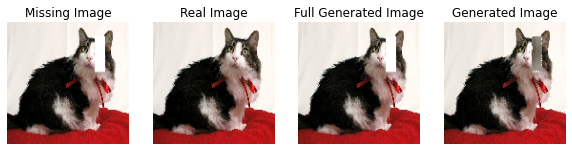

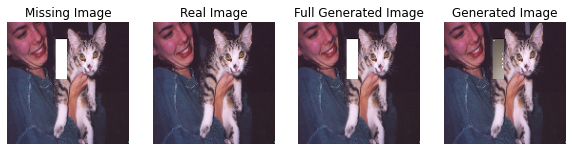

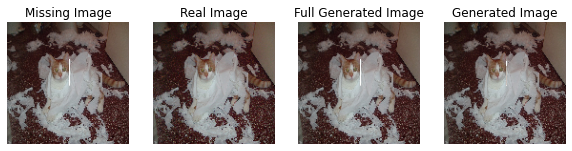

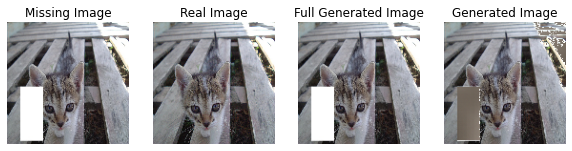

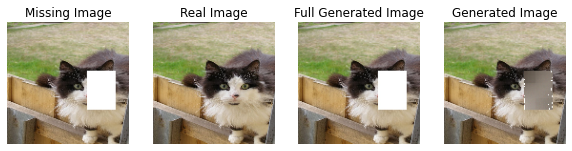

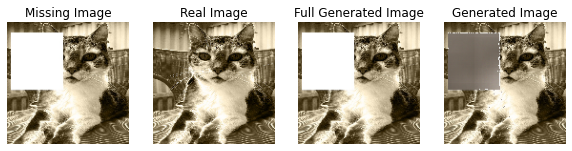

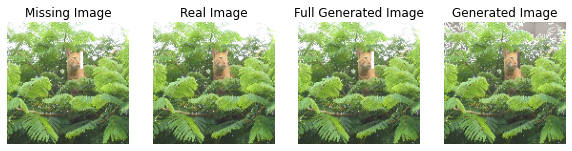

Epoch number: 2/15, Batch: 4522/4522, G Loss:0.2104, G Adv Accuracy:0.0000%, D Loss:0.5032, D Accuracy:100.0000%

Finished Epoch: 2,
Generator Combined Loss:0.2104,
Generator Reconstruction Loss:0.1809,
Generator Adversarial Loss:0.4763, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5032, Discriminator Acc:%100.00


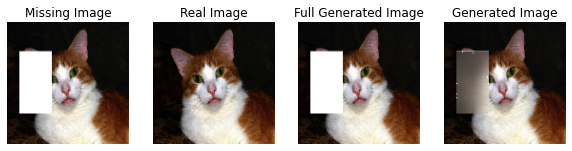

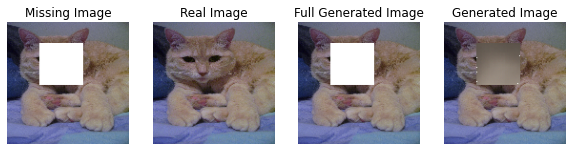

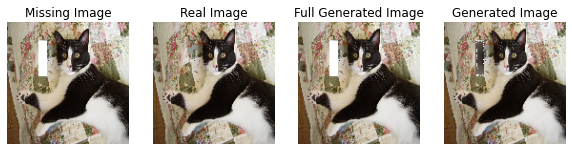

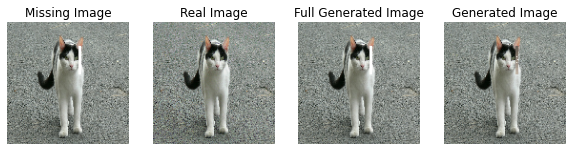

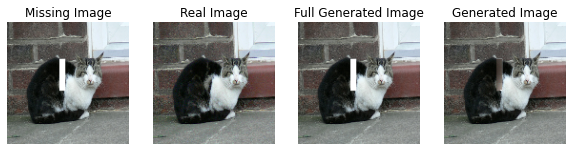

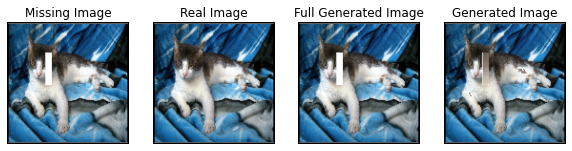

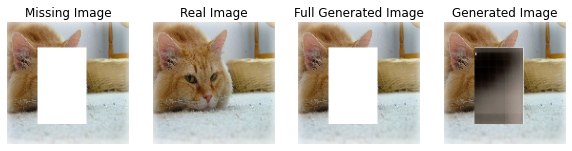

Epoch number: 3/15, Batch: 4522/4522, G Loss:0.1836, G Adv Accuracy:0.0000%, D Loss:0.5032, D Accuracy:100.0000%

Finished Epoch: 3,
Generator Combined Loss:0.1836,
Generator Reconstruction Loss:0.1511,
Generator Adversarial Loss:0.4768, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5032, Discriminator Acc:%100.00


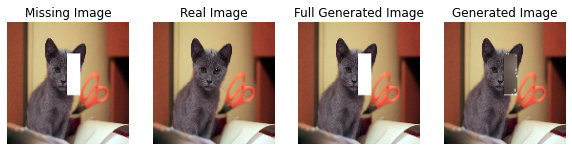

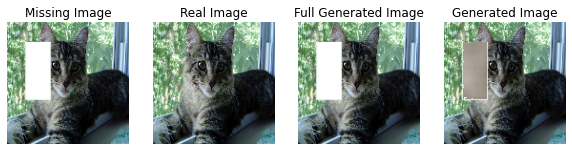

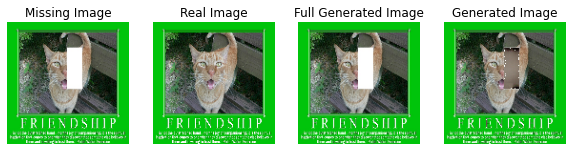

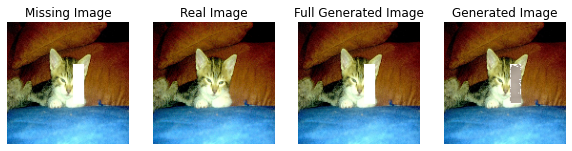

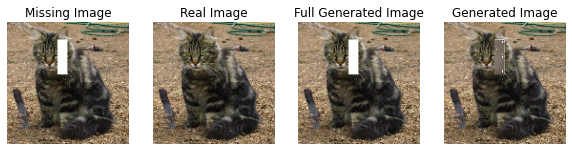

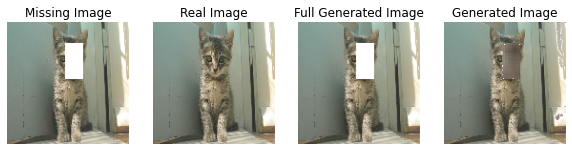

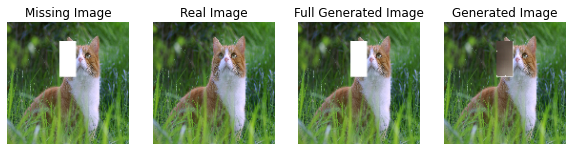

Epoch number: 4/15, Batch: 4522/4522, G Loss:0.1585, G Adv Accuracy:0.0000%, D Loss:0.5032, D Accuracy:100.0000%

Finished Epoch: 4,
Generator Combined Loss:0.1585,
Generator Reconstruction Loss:0.1231,
Generator Adversarial Loss:0.4774, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5032, Discriminator Acc:%100.00


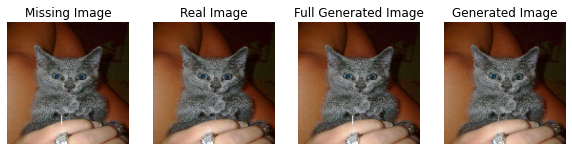

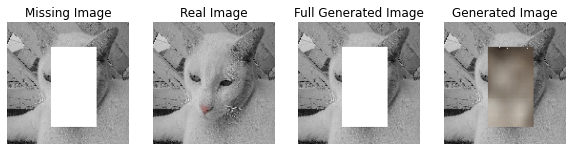

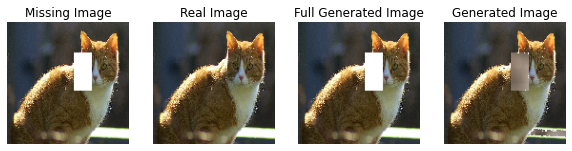

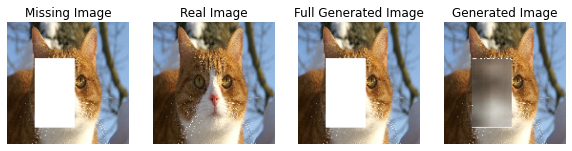

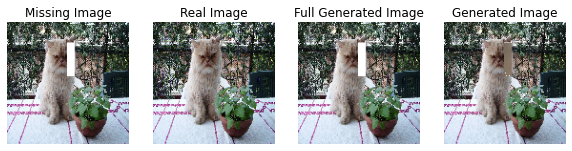

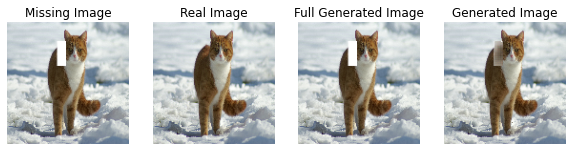

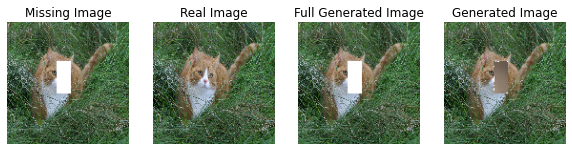

Epoch number: 5/15, Batch: 4522/4522, G Loss:0.1407, G Adv Accuracy:9.1774%, D Loss:0.5069, D Accuracy:99.2592%

Finished Epoch: 5,
Generator Combined Loss:0.1407,
Generator Reconstruction Loss:0.1035,
Generator Adversarial Loss:0.4749, Generator Adversarial Acc:%9.18,
Discriminator Loss:0.5069, Discriminator Acc:%99.26


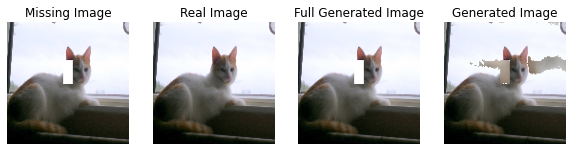

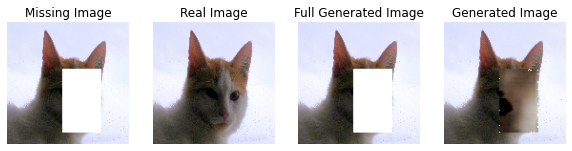

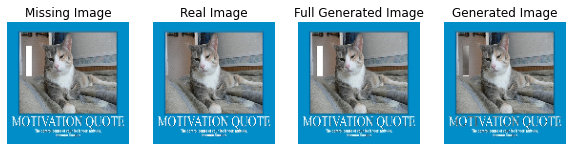

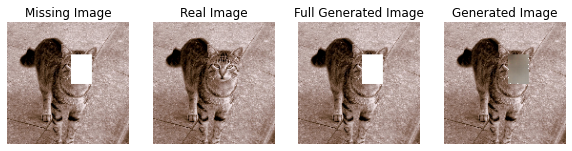

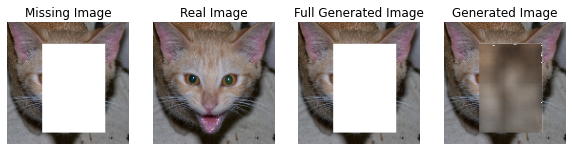

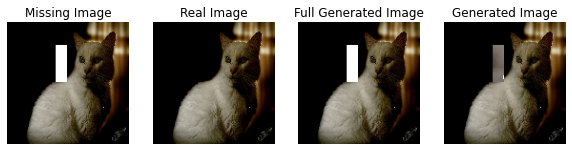

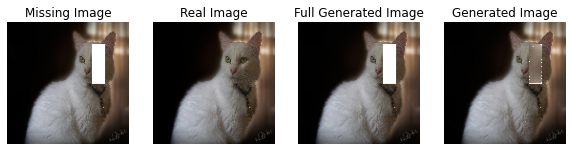

Epoch number: 6/15, Batch: 4522/4522, G Loss:0.1298, G Adv Accuracy:25.0553%, D Loss:0.5060, D Accuracy:99.4361%

Finished Epoch: 6,
Generator Combined Loss:0.1298,
Generator Reconstruction Loss:0.0898,
Generator Adversarial Loss:0.4897, Generator Adversarial Acc:%25.06,
Discriminator Loss:0.5060, Discriminator Acc:%99.44


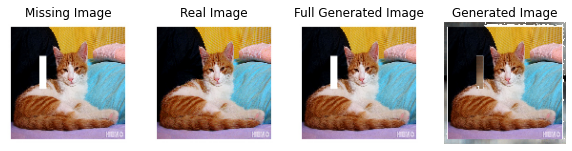

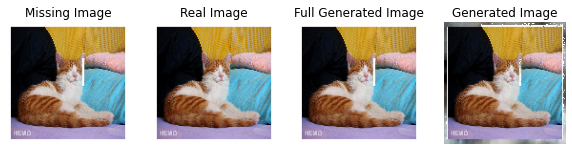

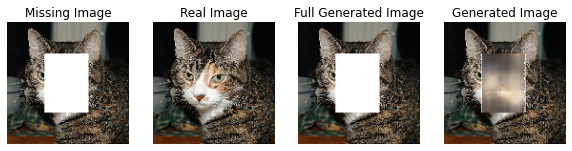

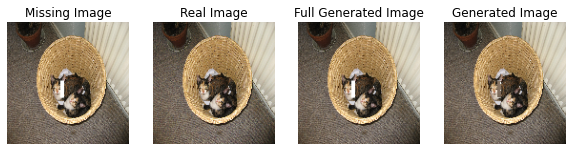

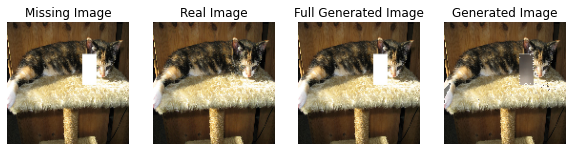

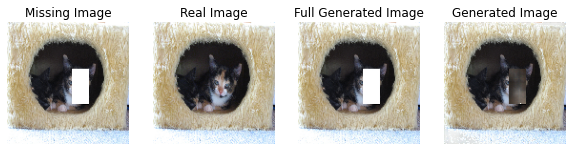

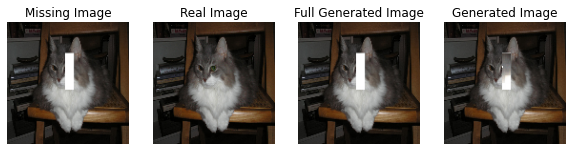

Epoch number: 7/15, Batch: 4522/4522, G Loss:0.1213, G Adv Accuracy:0.0000%, D Loss:0.5035, D Accuracy:99.9337%

Finished Epoch: 7,
Generator Combined Loss:0.1213,
Generator Reconstruction Loss:0.0801,
Generator Adversarial Loss:0.4919, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5035, Discriminator Acc:%99.93


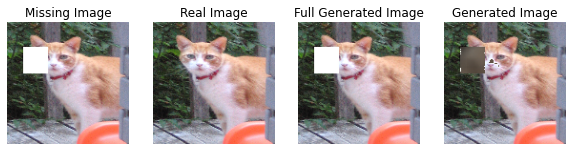

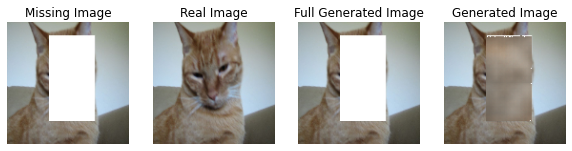

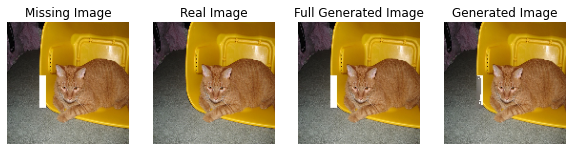

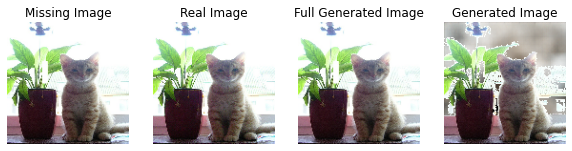

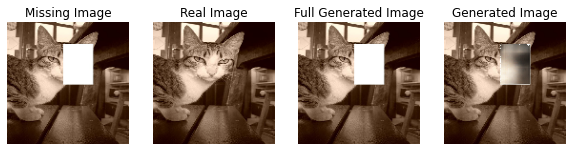

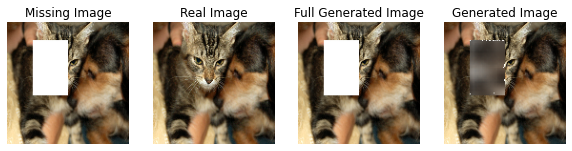

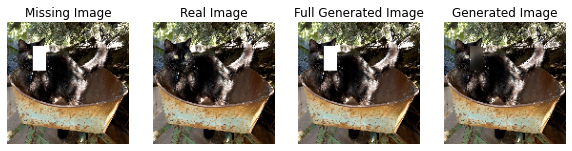

Epoch number: 8/15, Batch: 4522/4522, G Loss:0.1160, G Adv Accuracy:0.0000%, D Loss:0.5032, D Accuracy:100.0000%

Finished Epoch: 8,
Generator Combined Loss:0.1160,
Generator Reconstruction Loss:0.0726,
Generator Adversarial Loss:0.5068, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5032, Discriminator Acc:%100.00


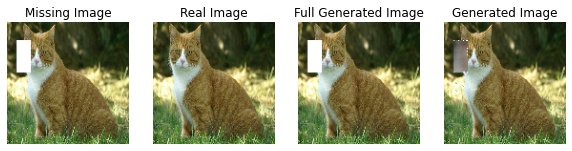

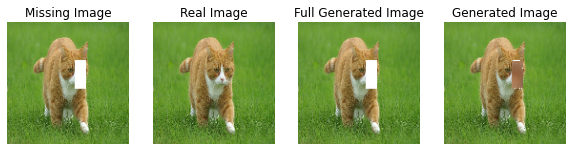

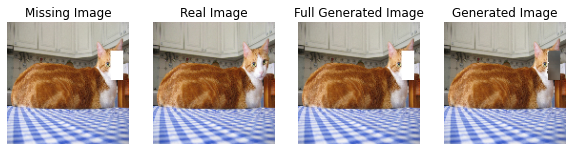

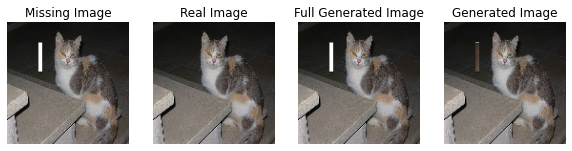

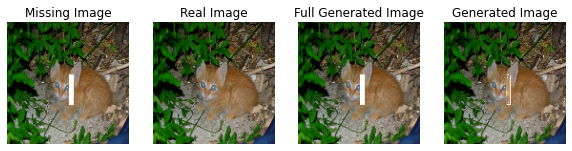

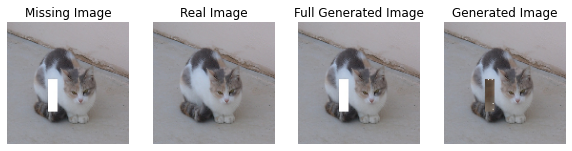

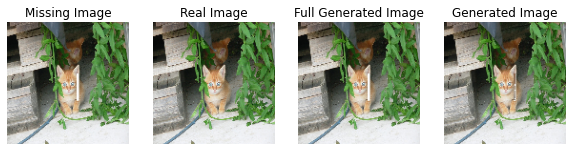

Epoch number: 9/15, Batch: 4522/4522, G Loss:0.1151, G Adv Accuracy:0.0000%, D Loss:0.5038, D Accuracy:99.9005%

Finished Epoch: 9,
Generator Combined Loss:0.1151,
Generator Reconstruction Loss:0.0669,
Generator Adversarial Loss:0.5488, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5038, Discriminator Acc:%99.90


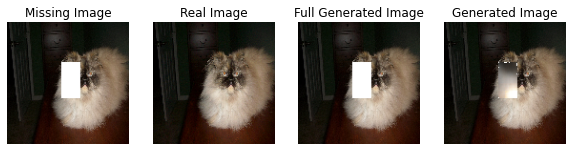

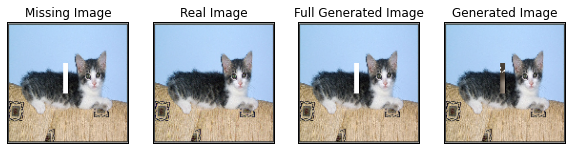

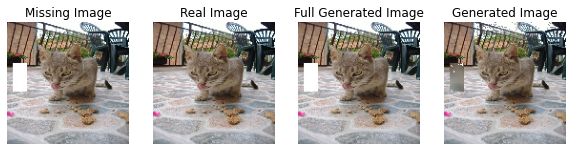

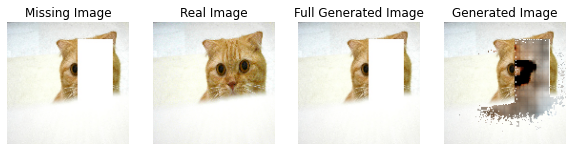

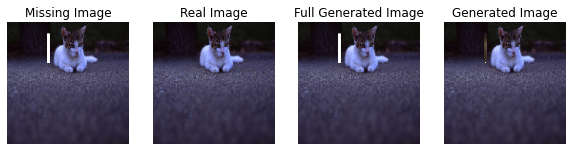

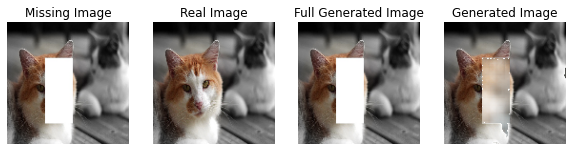

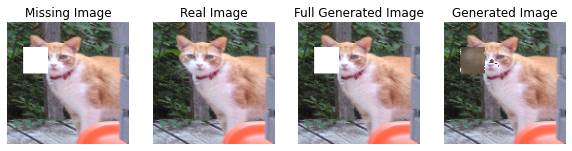

Epoch number: 10/15, Batch: 4522/4522, G Loss:0.1197, G Adv Accuracy:0.0000%, D Loss:0.5042, D Accuracy:99.7789%

Finished Epoch: 10,
Generator Combined Loss:0.1197,
Generator Reconstruction Loss:0.0624,
Generator Adversarial Loss:0.6354, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5042, Discriminator Acc:%99.78


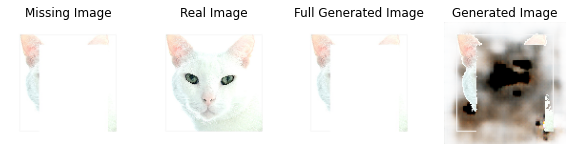

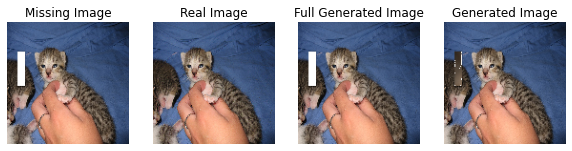

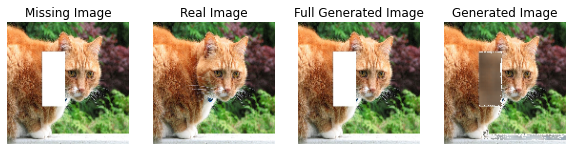

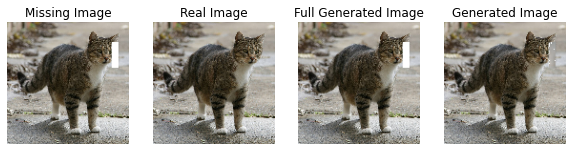

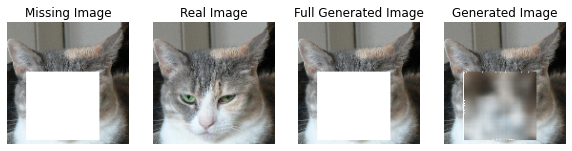

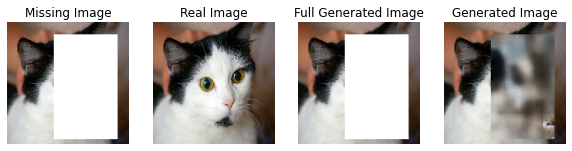

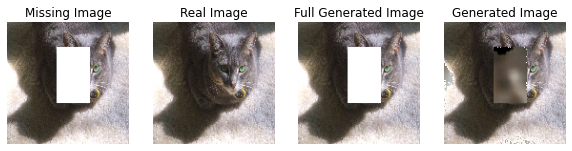

Epoch number: 11/15, Batch: 4522/4522, G Loss:0.1146, G Adv Accuracy:0.0000%, D Loss:0.5043, D Accuracy:99.7678%

Finished Epoch: 11,
Generator Combined Loss:0.1146,
Generator Reconstruction Loss:0.0585,
Generator Adversarial Loss:0.6196, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5043, Discriminator Acc:%99.77


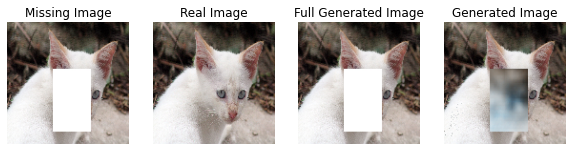

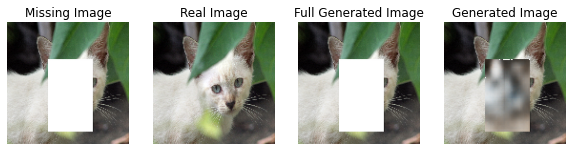

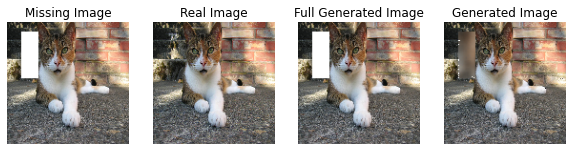

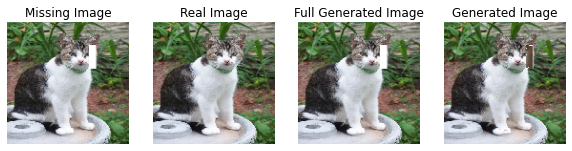

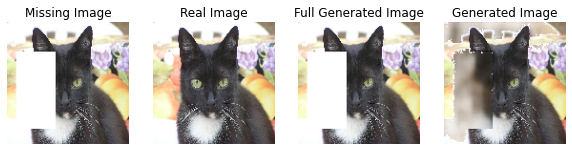

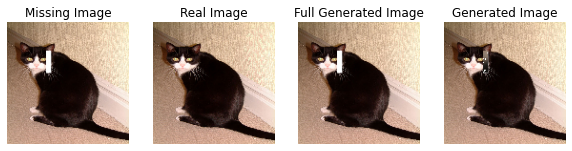

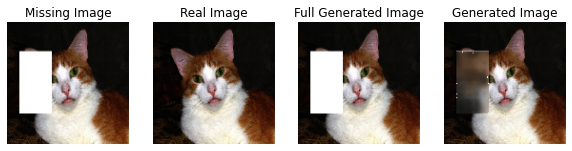

Epoch number: 12/15, Batch: 4522/4522, G Loss:0.1148, G Adv Accuracy:0.0000%, D Loss:0.5032, D Accuracy:100.0000%

Finished Epoch: 12,
Generator Combined Loss:0.1148,
Generator Reconstruction Loss:0.0551,
Generator Adversarial Loss:0.6524, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5032, Discriminator Acc:%100.00


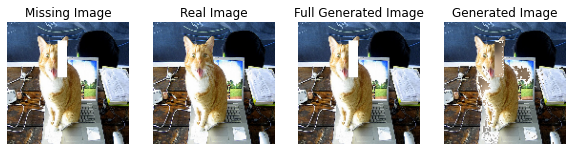

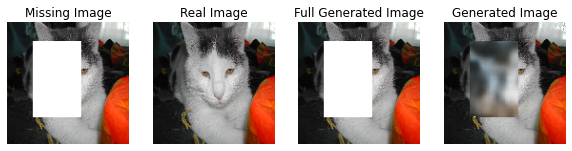

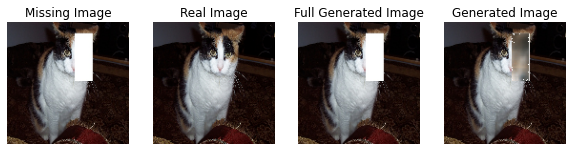

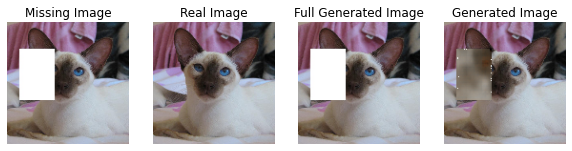

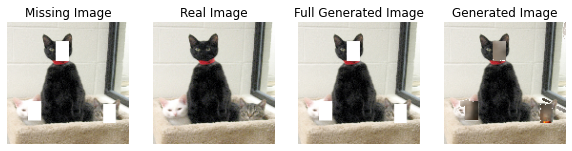

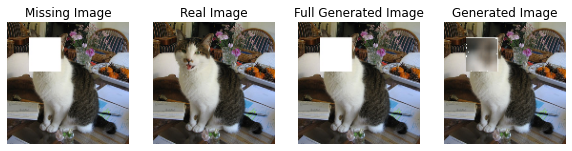

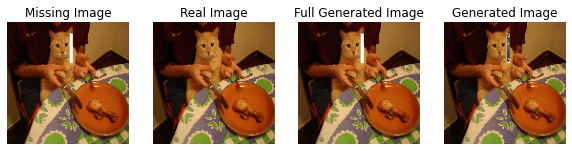

Epoch number: 13/15, Batch: 4522/4522, G Loss:0.1120, G Adv Accuracy:0.0000%, D Loss:0.5032, D Accuracy:100.0000%

Finished Epoch: 13,
Generator Combined Loss:0.1120,
Generator Reconstruction Loss:0.0521,
Generator Adversarial Loss:0.6512, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5032, Discriminator Acc:%100.00


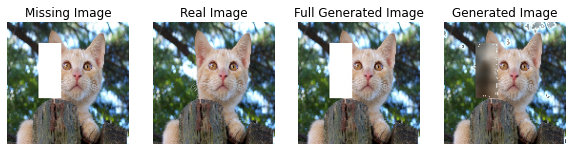

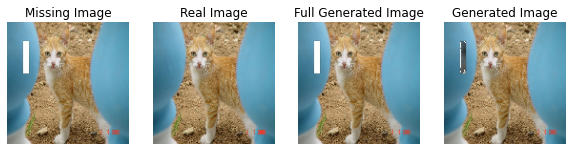

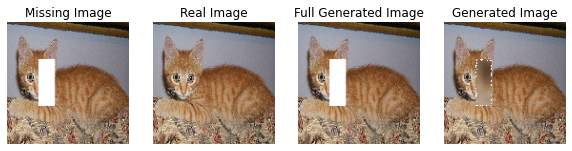

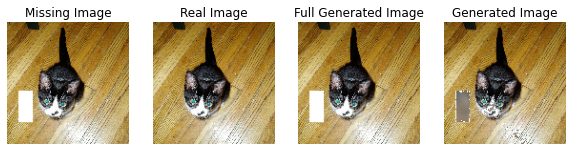

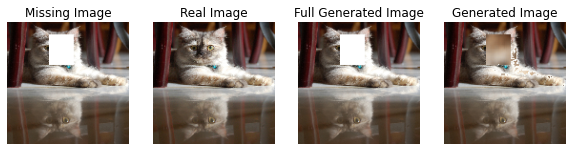

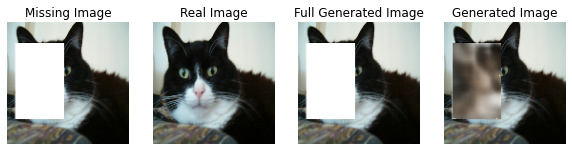

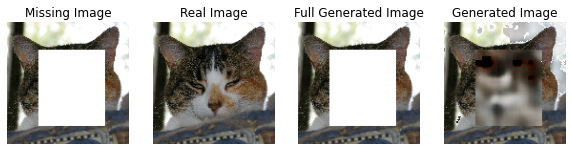

Epoch number: 14/15, Batch: 4522/4522, G Loss:0.1096, G Adv Accuracy:0.0000%, D Loss:0.5032, D Accuracy:100.0000%

Finished Epoch: 14,
Generator Combined Loss:0.1096,
Generator Reconstruction Loss:0.0495,
Generator Adversarial Loss:0.6501, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5032, Discriminator Acc:%100.00


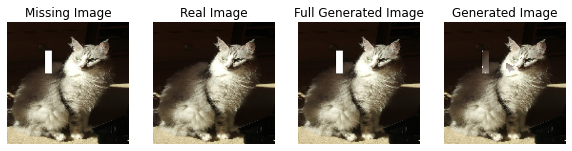

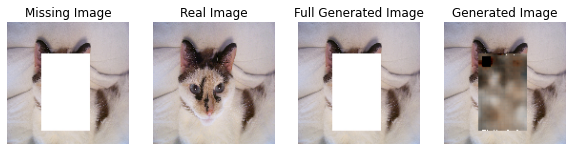

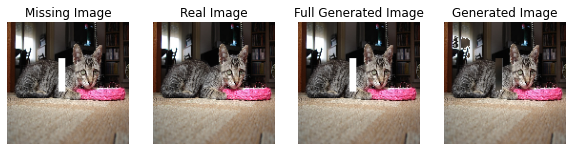

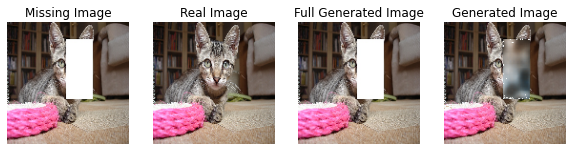

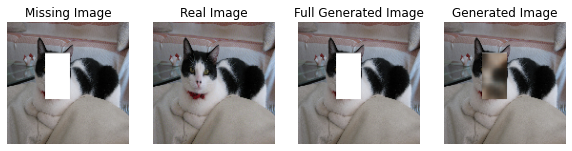

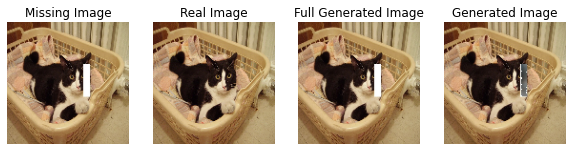

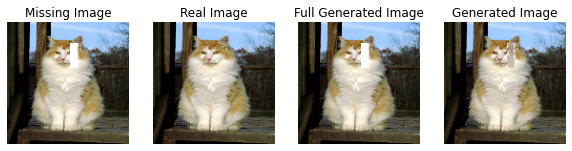

Epoch number: 15/15, Batch: 4522/4522, G Loss:0.1077, G Adv Accuracy:0.0000%, D Loss:0.5032, D Accuracy:100.0000%

Finished Epoch: 15,
Generator Combined Loss:0.1077,
Generator Reconstruction Loss:0.0475,
Generator Adversarial Loss:0.6501, Generator Adversarial Acc:%0.00,
Discriminator Loss:0.5032, Discriminator Acc:%100.00


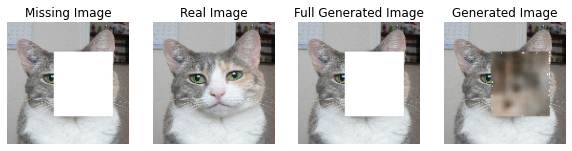

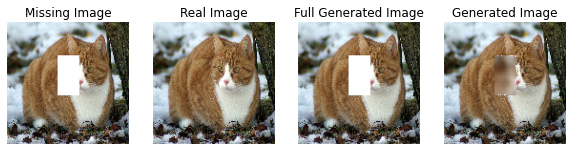

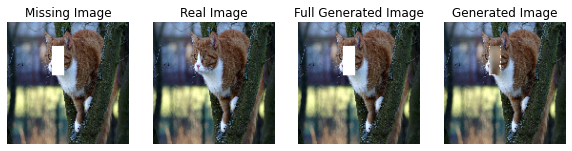

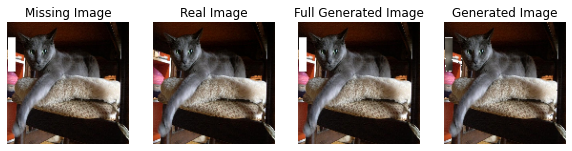

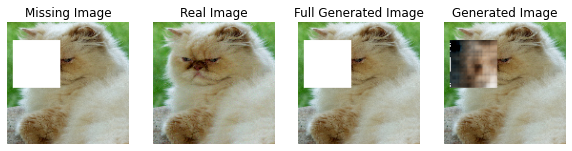

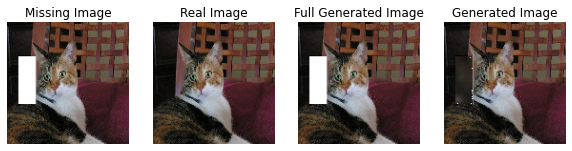

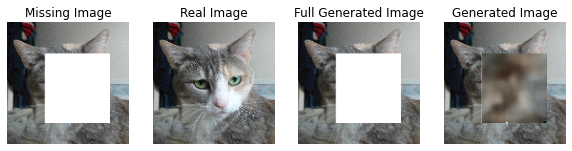

Finished training after 182 minutes.


In [ ]:
history = train_gan(train_dataset, val_dataset,EPOCHS, generator,discriminator,d_loss_func, g_optimizer,d_optimizer
                    ,g_acc_metric,d_acc_metric)

Now that the training process is done after 182 minuts, we will plot the history and evaluate the model on a test set.

In [ ]:
generator.save(models_path+f"/{experiance_name}_g.h5")
discriminator.save(models_path+f"/{experiance_name}_d.h5")

## Evaluate

In [ ]:
def plot_loss(history):
  plt.plot(history['g_loss'])
  plt.plot(history['d_loss'])
  plt.title('gan loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['generator', 'discriminator'], loc='upper left')
  plt.show()

def plot_accuracy(history):
  plt.plot(history['g_accuracy'])
  plt.plot(history['d_accuracy'])
  plt.title('gan accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['generator', 'discriminator'], loc='upper left')
  plt.show()


def plot_history(history):
  plot_loss(history)
  plot_accuracy(history)

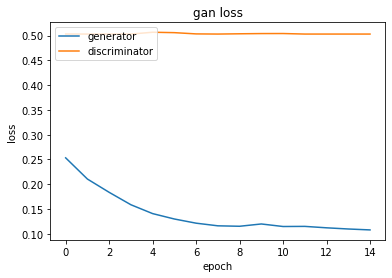

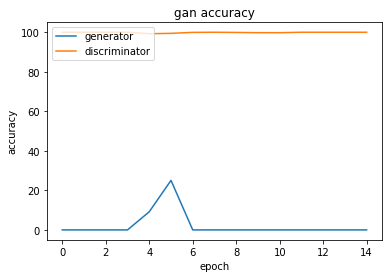

In [ ]:
plot_history(history)

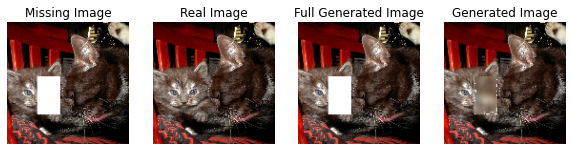

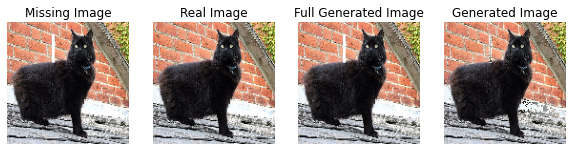

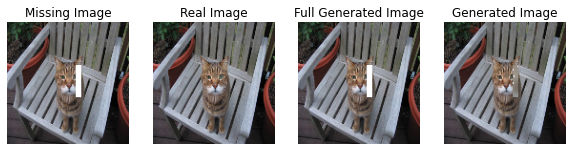

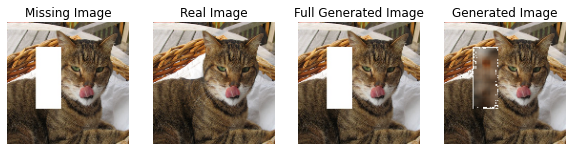

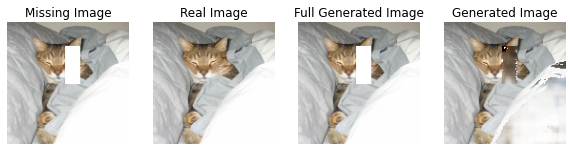

...

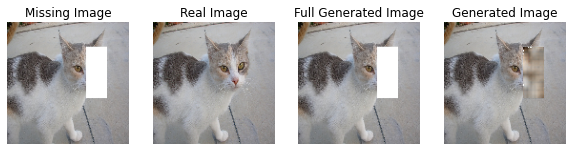

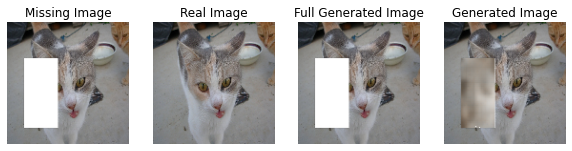

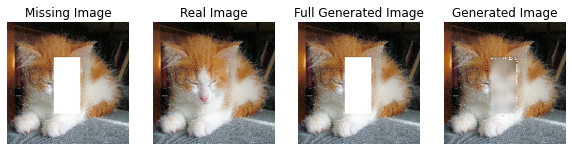

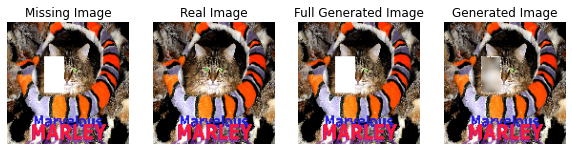

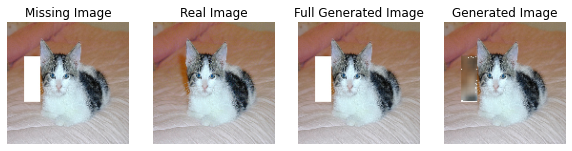

In [ ]:
num_val_plots = 20
index = random.randrange(len(test_dataset) - num_val_plots)
for i, batch in enumerate(test_dataset.skip(index)):
  missing_img = batch[0,0]
  x = preproccess(missing_img)
  real_img= batch[0,1]
  generated_img = generator(np.array([x]))
  plot_prediction(missing_img.numpy(), real_img.numpy(), generated_img[0].numpy())
  if i > num_val_plots:
    break

<h4>Conclusions</h4>
We can see that the model recaptures the general layout of the image less accurately then the first experiment where we did not used transfer learning but is resulting a sharper output image. Therefore we conclude that using a lower "Alpha" value might resault in better generated images.